INTRODUCTION AND OBJECTIVE:

The client is an insurance firm that has previously supplied Health Insurance to its clients. We are to develop a model to forecast if the customers from the previous year will be interested in the company's Vehicle Insurance.

we are using the dataset that was found on Kaggle. https://www.kaggle.com/anmolkumar/health-insurance-cross-sell-prediction.

IMPORT REQUIRED LIBRARIES

In [1]:
import pandas  as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder 
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.metrics import roc_curve

from imblearn.over_sampling import RandomOverSampler
from collections import Counter
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score,recall_score,accuracy_score,f1_score,confusion_matrix,roc_auc_score,classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
import warnings
warnings.filterwarnings('ignore')
sns.set_theme(style="darkgrid")

LOAD THE DATASET

In [34]:
data=pd.read_csv("insurace.csv")

2. EXPLORE AND PREPARE THE DATA

In [3]:
data.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


In [4]:
data.tail()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
381104,381105,Male,74,1,26.0,1,1-2 Year,No,30170.0,26.0,88,0
381105,381106,Male,30,1,37.0,1,< 1 Year,No,40016.0,152.0,131,0
381106,381107,Male,21,1,30.0,1,< 1 Year,No,35118.0,160.0,161,0
381107,381108,Female,68,1,14.0,0,> 2 Years,Yes,44617.0,124.0,74,0
381108,381109,Male,46,1,29.0,0,1-2 Year,No,41777.0,26.0,237,0


In [5]:
data=data.drop(columns = ['id'])
print(data.info())
print(data.isna().sum())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Gender                381109 non-null  object 
 1   Age                   381109 non-null  int64  
 2   Driving_License       381109 non-null  int64  
 3   Region_Code           381109 non-null  float64
 4   Previously_Insured    381109 non-null  int64  
 5   Vehicle_Age           381109 non-null  object 
 6   Vehicle_Damage        381109 non-null  object 
 7   Annual_Premium        381109 non-null  float64
 8   Policy_Sales_Channel  381109 non-null  float64
 9   Vintage               381109 non-null  int64  
 10  Response              381109 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 32.0+ MB
None
Gender                  0
Age                     0
Driving_License         0
Region_Code             0
Previously_Insured      0
Vehicle_Age    

Dataset has 381109 rows and 12 columns. There is no missing values present in dataset

In [6]:
#Statistical Summary of Numeric Variables
data.describe()

,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


In [7]:
# encoding the columns using labelEncoder
label= LabelEncoder()

label.fit(data.Gender.drop_duplicates())
data.Gender= label.transform(data.Gender)

label.fit(data.Vehicle_Damage.drop_duplicates())
data.Vehicle_Damage= label.transform(data.Vehicle_Damage)

label.fit(data.Vehicle_Age.drop_duplicates())
data.Vehicle_Age= label.transform(data.Vehicle_Age)

data.head()

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,44,1,28.0,0,2,1,40454.0,26.0,217,1
1,1,76,1,3.0,0,0,0,33536.0,26.0,183,0
2,1,47,1,28.0,0,2,1,38294.0,26.0,27,1
3,1,21,1,11.0,1,1,0,28619.0,152.0,203,0
4,0,29,1,41.0,1,1,0,27496.0,152.0,39,0


3. DATA VISUALIZATIONS

Target Variable - Response

In [8]:
fig=px.histogram(data, x="Age", color="Response", marginal="violin",title ="Distribution of Age vs Response", 
                   labels={"Age": "Age"},
                   template="plotly_dark",
                   color_discrete_map={"0": "Not Buy", "1": "Buy"})
fig.show()

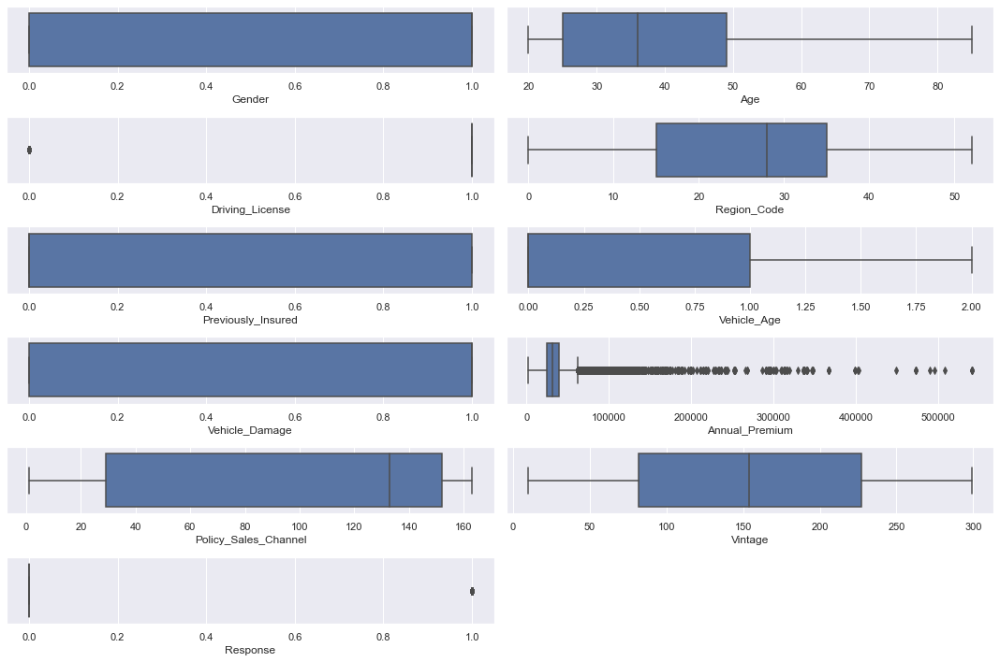

In [32]:
## Looking at the box plot to check all the outliers 

plt.figure(figsize = (15, 10))
x = 1 

for column in data.describe().columns:
    plt.subplot(6,2, x)
    sns.boxplot(data[column])
    x+=1 

plt.tight_layout()
plt.show()


In [33]:
## binning the annual premium into groups 

bin_premium_group = [2600, 25000, 50000, 100000, 200000, data['Annual_Premium'].max()]
label_bin = ['Bronze', 'Silver', 'Gold', 'Platinum', 'Diamond']

data['Premium_Group'] = pd.cut(data['Annual_Premium'], bins = bin_premium_group, labels = label_bin)
data.head()

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response,Premium_Group
0,1,44,1,28.0,0,2,1,40454.0,26.0,217,1,Silver
1,1,76,1,3.0,0,0,0,33536.0,26.0,183,0,Silver
2,1,47,1,28.0,0,2,1,38294.0,26.0,27,1,Silver
3,1,21,1,11.0,1,1,0,28619.0,152.0,203,0,Silver
4,0,29,1,41.0,1,1,0,27496.0,152.0,39,0,Silver


<AxesSubplot:xlabel='Response', ylabel='count'>

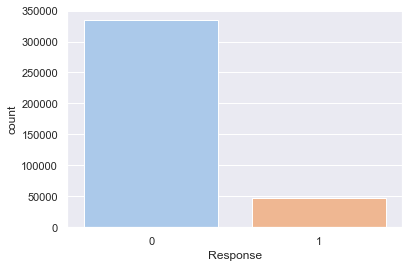

In [10]:
sns.set_theme(style="darkgrid")
sns.countplot(data['Response'],data=data, palette='pastel')

Infernces : People below 30 are not interested in vehicle insurance.
            People aged between 30-60 are more likely to be interested.

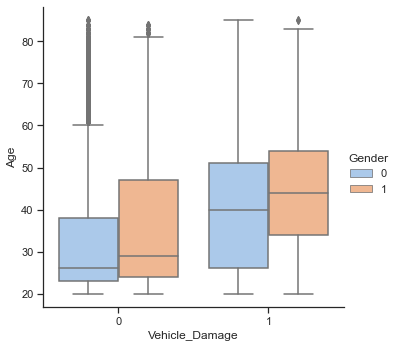

In [11]:
with sns.axes_style(style='ticks'):
    g = sns.catplot("Vehicle_Damage", "Age", "Gender", data=data, kind="box",palette='pastel')
    g.set_axis_labels("Vehicle_Damage", "Age");

GENDER

In [12]:
pd.crosstab(index = data['Response'], columns = data['Gender'], normalize = 'index')

Gender,0,1
Response,,
0,0.469006,0.530994
1,0.389317,0.610683


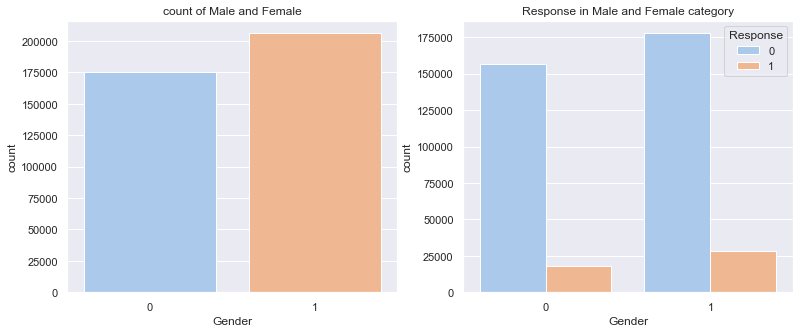

In [13]:
pd.crosstab(index = data['Response'], columns = data['Gender'], normalize = 'index')
plt.figure(figsize = (13,5))
plt.subplot(1,2,1)
sns.countplot(data['Gender'],palette='pastel')
plt.title("count of Male and Female")
plt.subplot(1,2,2)
sns.countplot(data['Gender'], hue = data['Response'],palette='pastel')
plt.title("Response in Male and Female category")
plt.show()

Inference: The gender variable in the dataset is almost equally distributed.
Male category is slightly greater than that of female and chances of buying the insurance is also little high.

In [14]:
###Average age and Response

pd.crosstab(index = data['Response'], columns = 'Average Age', values = data['Age'], aggfunc='mean')

col_0,Average Age
Response,
0,38.178227
1,43.435560


Inference : The average age of customer who is interested with vehicle insurance is 43 years old while for customers who's not interested are 38 years
It shows that younger customers are not interested with vehicle insurance

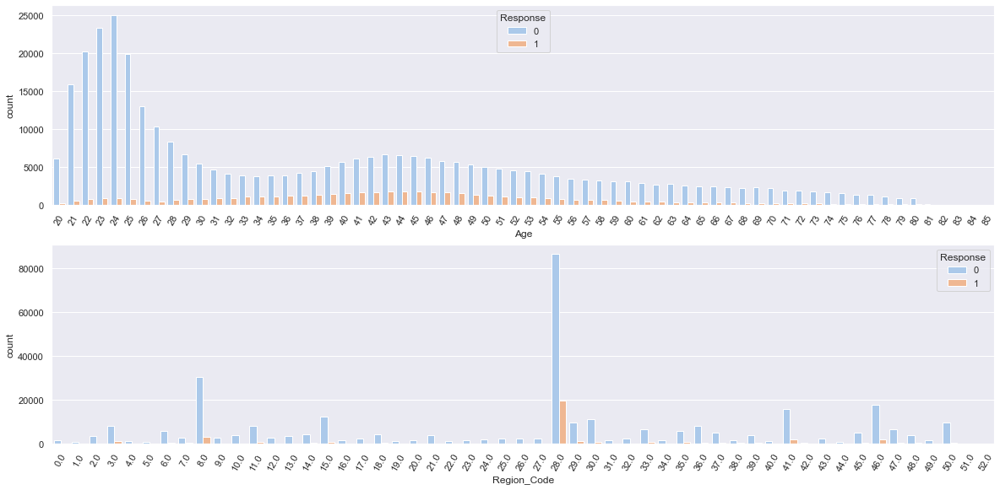

In [15]:
plt.figure(figsize = (10,10))
plt.subplot(4,1,1)
sns.countplot(data['Age'],hue=data['Response'],palette='pastel')
locs, labels = plt.xticks()
plt.setp(labels, rotation=60)
plt.subplot(4,1,2)
sns.countplot(data['Region_Code'],hue=data['Response'],palette='pastel')
locs, labels = plt.xticks()
plt.setp(labels, rotation=60)
plt.show()

Inferences : People ages between from 38 to 50 are more likely to respond
             People ages between 20 to 30 are less likely to respond.
             People fom the region code 28 seem to be highly interested with the vehicle insurance

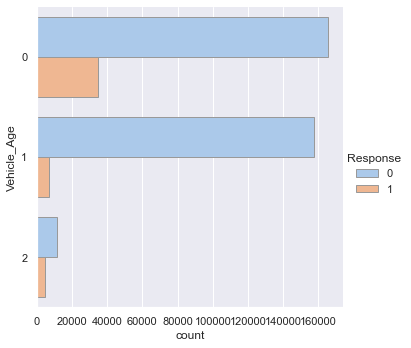

In [16]:
sns.catplot(y='Vehicle_Age', hue='Response', kind="count",
            palette="pastel", edgecolor=".6",
            data=data)

INFERENCE: Older the vehicle, interested are the people in purchasing the insurance.

Text(0.5, 1.05, 'Pearson correlation of Features')

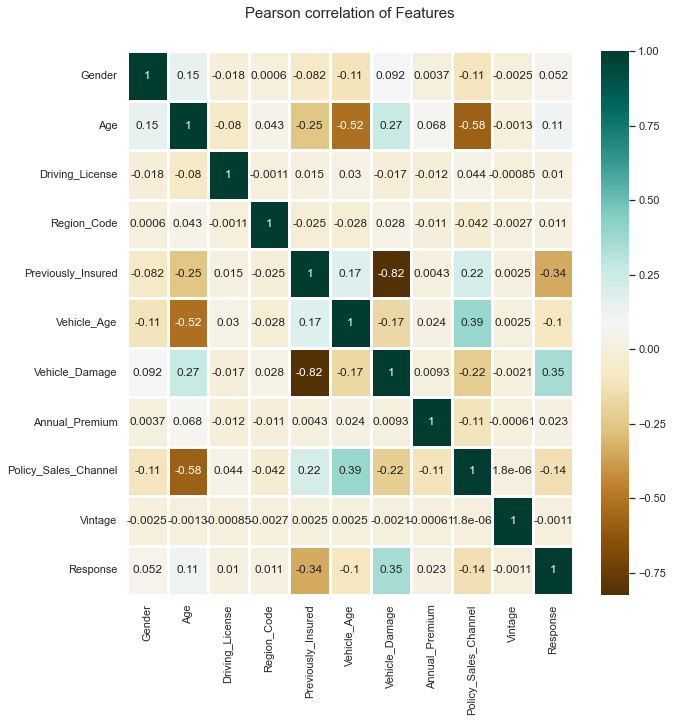

In [17]:
corr = data.corr()

f, ax = plt.subplots(figsize=(10,10))

sns.heatmap(corr, ax=ax, annot=True,linewidths=3,cmap='BrBG')

plt.title("Pearson correlation of Features", y=1.05, size=15)

Response, our target variable is not much affected by the variable 'Vintage'. Hence, we can drop least correlated variable.

In [18]:
correlation = data.corr()
correlation['Response'].sort_values(ascending = False)[1:]

# Sorting Column Correlation 

Vehicle_Damage          0.354400
Age                     0.111147
Gender                  0.052440
Annual_Premium          0.022575
Region_Code             0.010570
Driving_License         0.010155
Vintage                -0.001050
Vehicle_Age            -0.104078
Policy_Sales_Channel   -0.139042
Previously_Insured     -0.341170
Name: Response, dtype: float64

The variables 'previously insured', 'policy sales channel', 'vehicle age', 'vintage' are negatively correlated. The target variable 'Response' is not dependent upen these variables, hence, they can be eliminated. The same is shown below in the plot
Seprating dependent and independent variables

In [19]:
x=data.drop(['Response'],axis=1) #contains all  independent variables
y=data['Response']           #dependent variable

[0.00506103 0.1450766  0.0004645  0.10719355 0.0507629  0.01579566
 0.08106774 0.24658518 0.07134216 0.27665069]


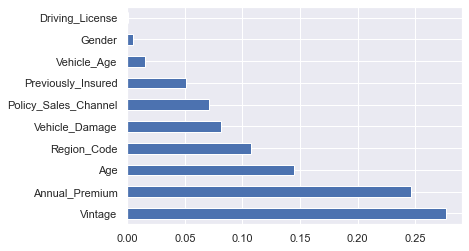

In [20]:
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(x,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based clas
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=x.columns)
feat_importances.nlargest(11).plot(kind='barh')
plt.show()



In [21]:
X = data.drop(columns = [ 'Driving_License','Response', 'Region_Code', 'Policy_Sales_Channel', 'Gender', 'Vintage'])
y = data['Response']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42, test_size = 0.2)

sm = SMOTE(random_state = 42)
X_train_sm, y_train_sm = sm.fit_resample(X_train, y_train)

data['Response'].value_counts()


0    334399
1     46710
Name: Response, dtype: int64

In [22]:
df_smote = pd.concat([X_train_sm, y_train_sm], axis = 1)
df_smote['Response'].value_counts()

# Now the model is balanced we can proceed with model building


1    267700
0    267700
Name: Response, dtype: int64

Logistic Regression Model Building

In [23]:
log_reg_clf = LogisticRegression()

log_reg_clf.fit(X_train_sm, y_train_sm)

LogisticRegression()

y_pred_log_reg = log_reg_clf.predict(X_test)

acc_logreg = accuracy_score(y_test, y_pred_log_reg)
recall_logreg = recall_score(y_test, y_pred_log_reg)
prec_logreg = precision_score(y_test, y_pred_log_reg)
f1_logreg = f1_score(y_test, y_pred_log_reg)
AUC_LR=roc_auc_score(y_pred_log_reg,y_test)

#print accuracy and Auc values of model
print("Accuracy : ", accuracy_score(y_test,y_pred_log_reg))
print("ROC_AUC Score:",AUC_LR)

print(classification_report(y_test, y_pred_log_reg))


Accuracy :  0.3964603395345176
ROC_AUC Score: 0.5413637629834754
              precision    recall  f1-score   support

           0       0.93      0.33      0.49     66699
           1       0.15      0.83      0.26      9523

    accuracy                           0.40     76222
   macro avg       0.54      0.58      0.37     76222
weighted avg       0.83      0.40      0.46     76222



INFERENCE: 

<AxesSubplot:>

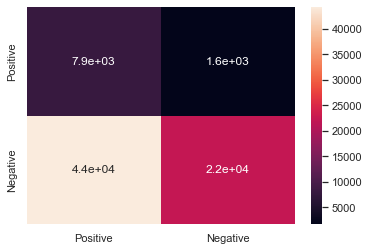

In [24]:
cm_log_reg = confusion_matrix(y_test, y_pred_log_reg, labels = [1,0])

df_logreg = pd.DataFrame(data = cm_log_reg , index = ["Positive","Negative"], columns = ["Positive","Negative"])
sns.heatmap(df_logreg, annot = True)



KNN Classfier 

In [25]:
knn_clf = KNeighborsClassifier()

knn_clf.fit(X_train_sm, y_train_sm)

y_pred_knn = knn_clf.predict(X_test)

acc_KNN = accuracy_score(y_test, y_pred_knn)
recall_KNN = recall_score(y_test, y_pred_knn)
prec_KNN = precision_score(y_test, y_pred_knn)
f1_KNN = f1_score(y_test, y_pred_knn)
AUC_KNN=roc_auc_score(y_pred_log_reg,y_test)
print(classification_report(y_test, y_pred_knn))
print("Accuracy : ", accuracy_score(y_test,y_pred_knn))
print("ROC_AUC Score:",AUC_KNN)


              precision    recall  f1-score   support

           0       0.90      0.76      0.82     66699
           1       0.20      0.43      0.27      9523

    accuracy                           0.72     76222
   macro avg       0.55      0.59      0.55     76222
weighted avg       0.81      0.72      0.75     76222

Accuracy :  0.7163023798903204
ROC_AUC Score: 0.5413637629834754


<AxesSubplot:>

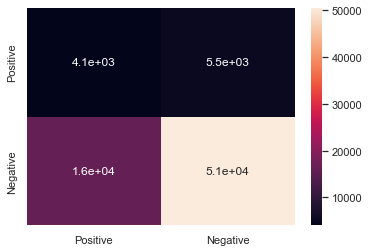

In [26]:
cm_knn = confusion_matrix(y_test, y_pred_knn, labels = [1,0])
cm_knn
df_knn =  pd.DataFrame(data = cm_knn  , index = ["Positive","Negative"], columns = ["Positive","Negative"])
sns.heatmap(df_knn, annot = True)




Random Forest Classifier

In [27]:
rf_clf = RandomForestClassifier()

rf_clf.fit(X_train_sm, y_train_sm)
y_pred_rf = rf_clf.predict(X_test)

acc_RF = accuracy_score(y_test,y_pred_rf)
prec_RF = precision_score(y_test, y_pred_rf)
rec_RF = recall_score(y_test, y_pred_rf)
f1_RF = f1_score(y_test, y_pred_rf)
AUC_RF=roc_auc_score(y_pred_rf,y_test)

print(classification_report(y_test, y_pred_rf))
print("Accuracy : ", accuracy_score(y_test,y_pred_rf))
print("ROC_AUC Score:",AUC_RF)

              precision    recall  f1-score   support

           0       0.94      0.77      0.85     66699
           1       0.28      0.63      0.39      9523

    accuracy                           0.75     76222
   macro avg       0.61      0.70      0.62     76222
weighted avg       0.85      0.75      0.79     76222

Accuracy :  0.7530896591535252
ROC_AUC Score: 0.6085755948942017


<AxesSubplot:>

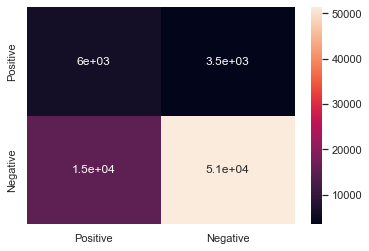

In [28]:
cm_rf = confusion_matrix(y_test, y_pred_rf, labels = [1,0])

df_knn =  pd.DataFrame(data = cm_rf  , index = ["Positive","Negative"], columns = ["Positive","Negative"])
sns.heatmap(df_knn, annot = True)

ROC 

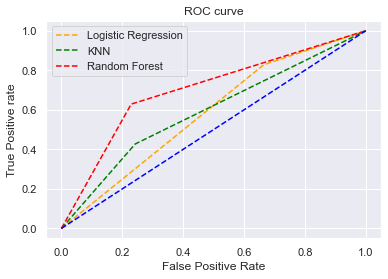

In [29]:
# ROC for Logistic Regression, KNN, Radom Forest
fpr, tpr, _ = roc_curve(y_test, y_pred_log_reg)
fpr_knn, tpr_knn, _ = roc_curve(y_test, y_pred_knn)
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_pred_rf)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

plt.plot(fpr, tpr, linestyle='--',color='orange', label='Logistic Regression')
plt.plot(fpr_knn, tpr_knn, linestyle='--',color='green', label='KNN')
plt.plot(fpr_rf, tpr_rf, linestyle='--', color='red',  label='Random Forest')
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show()

Inferences: It is evident from the plot that the AUC for the Random Forest ROC curve is higher than that for the KNN  and Logistic regression ROC curve. Therefore, we can say that Random Forest did a better job of classifying the positive class in the dataset.

Comparing the models

In [30]:
eva_met = {
    "LogisticReg": [acc_logreg,prec_logreg,recall_logreg,f1_logreg],
    "KNN": [acc_KNN, prec_KNN, recall_KNN, f1_KNN],
    "RandomForest" : [acc_RF, prec_RF, rec_RF, f1_RF]
    }

eva = pd.DataFrame(data = eva_met, index = ['Accuracy', 'Precision', 'Recall', 'F1-Score'])
eva

,LogisticReg,KNN,RandomForest
Accuracy,0.396460,0.716302,0.753090
Precision,0.150949,0.200988,0.281484
Recall,0.828310,0.427071,0.628793
F1-Score,0.255362,0.273338,0.388882


CONCLUSION

Random Forest is the most accurate model for predicting the response from the customers. It scored an estimated accuracy of 75%, out performing the K nearest neghbour model by 4% and logistic regression model by about 36%.  
Precision talks about how precise the model is out of those predicted positive, how many of them are actual positive. Across the models used, random forest, with 28%, seems to predict how many of the customers are interested about the vehicle insurance.
Recall actually calculates how many of the Actual Positives our model capture through labeling it as Positive (True Positive). we can see that logistic regression model performs well with 82%.
